In [ ]:
#| hide
from NEST.preprocess import *
from NEST.tiles import *
from NEST.labels import *

import cv2
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams["figure.dpi"] = 300

# NEST

> NEST – Nuclear Extraction and Segmentation Tool

![Logo](/Users/mzarodniuk/Documents/SAI/NEST/data/logo.png)

Below you’ll find everything you need to get started with NEST, from installing the package to running a complete segmentation pipeline on your own images. The typical workflow involves:

1. Loading and visualizing your raw image  
2. Correcting illumination artifacts using CLAHE  
3. Dividing the image into overlapping tiles  
4. Segmenting nuclei with a pre‐trained CellPose model  
5. Stitching the tile‐level masks back into a full‐image segmentation  
6. Expanding nuclear labels to approximate cell boundaries  
7. Overlaying outlines and exporting results  

### Installation

Install latest from the GitHub [repository][repo]:

```sh
$ pip install git+https://github.com/plezar/NEST.git
```

or from [conda][conda]

```sh
$ conda install -c plezar NEST
```

or from [pypi][pypi]


```sh
$ pip install NEST
```


[repo]: https://github.com/plezar/NEST
[docs]: https://plezar.github.io/NEST/
[pypi]: https://pypi.org/project/NEST/
[conda]: https://anaconda.org/plezar/NEST

### Documentation

Documentation can be found hosted on this GitHub [repository][repo]'s [pages][docs]. Additionally you can find package manager specific guidelines on [conda][conda] and [pypi][pypi] respectively.

[repo]: https://github.com/plezar/NEST
[docs]: https://plezar.github.io/NEST/
[pypi]: https://pypi.org/project/NEST/
[conda]: https://anaconda.org/plezar/NEST

### How to use

The core inputs required to run NEST are:

1.	**Input Image**  
A grayscale microscopy image (TIFF or similar) containing the nuclei you wish to segment.

2.	**CellPose Model**  
Path to a pre-trained CellPose model.

3.	**Expansion Radius (µm)**  
The distance (in micrometers) by which to expand the nuclear masks to approximate whole-cell boundaries.

Given these inputs, NEST will:

* Load and enhance the image for uniform illumination.
* Split the image into overlapping tiles.
* Run segmentation on each tile.
* Stitch tile masks into a global mask.
* Optionally expand masks to full-cell labels.

In [ ]:
filename = "/Users/mzarodniuk/Documents/SAI/NEST/data/example_image.tif"
model_path = "/Users/mzarodniuk/Documents/SAI/NEST/data/example_model"
radius_um = 5.0

### Example Workflow

#### Reading the Input Image

We provide a sample image in the data folder. This image was acquired using a Leica Stellaris Dive system by stitching multiple 1024×1024 fields of view:

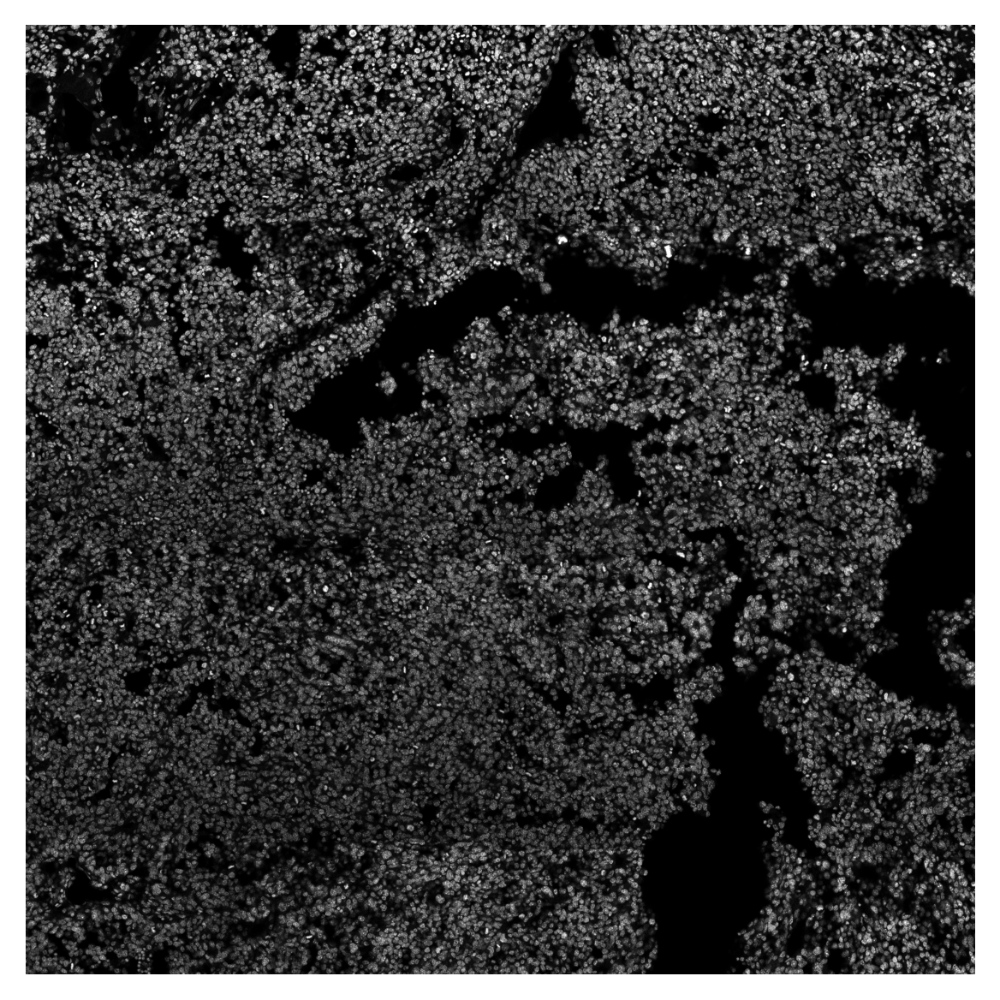

In [ ]:
image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

plt.imshow(image, cmap='grey')
plt.axis('off')
plt.show()

### Flat-Field Correction with CLAHE

Microscopy images often suffer from uneven illumination due to optical and sample variations. NEST uses Contrast Limited Adaptive Histogram Equalization (CLAHE) to address this:

* **Local Processing**: The image is divided into small tiles (matching the stitching grid).
* **Histogram Equalization**: Each tile’s brightness distribution is equalized independently.
* **Contrast Limiting**: A `clip_limit` prevents over-enhancement of noise.
* **Seamless Merging**: Tiles are blended back together to produce a smoothly corrected image.

In [ ]:
image_enh = clahe(image, clip_limit = 4, tile_grid_size = count(image, t = 1024, v = 0.1))

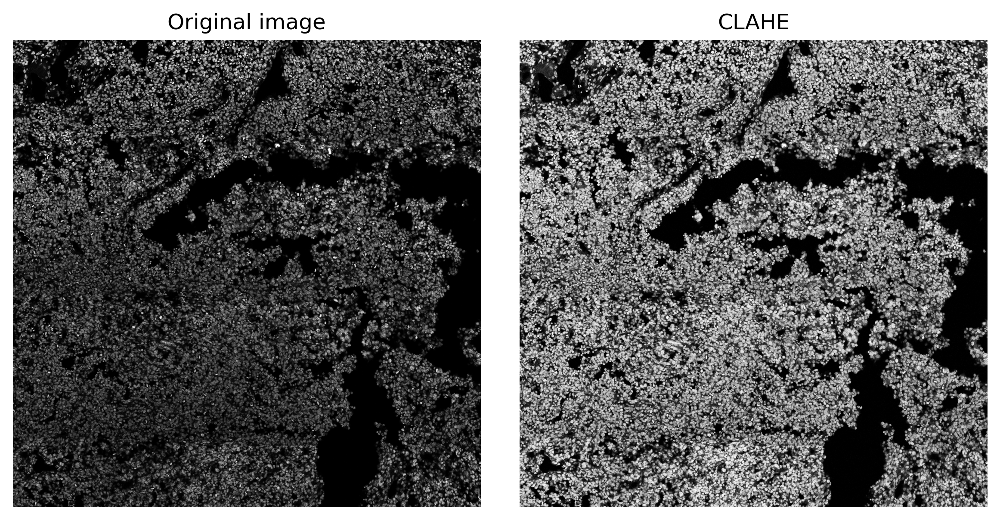

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

ax1.imshow(image, cmap='grey')
ax1.set_title('Original image')
ax1.axis('off')

ax2.imshow(image_enh, cmap='grey')
ax2.set_title('CLAHE')
ax2.axis('off')

plt.tight_layout()
plt.show()

Notice that local brightness gradients are flattened while preserving fine nuclear details.

### Tiling the Enhanced Image

To maintain segmentation accuracy at the edges of each tile, NEST splits the enhanced image into 128×128 pixel tiles with a 20-pixel overlap. This overlap captures nuclei that span tile borders, reducing artifacts. Larger overlap improves accuracy but increases computational load.

In [ ]:
tiles, x, y = split(image_enh, tile_size = (128, 128), overlap = 20)
print(tiles.shape)

(784, 128, 128)


### Segmentation

This example demonstrates nuclear segmentation, but the same workflow in principle can be applied to any segmentation task or (membrane or cytoplasmic).

In [ ]:
mask = predict(model_path, tiles, cellpose_param=(0.32, 0.08), use_gpu=True)

no seeds found in get_masks_torch - no masks found.
no seeds found in get_masks_torch - no masks found.
no seeds found in get_masks_torch - no masks found.


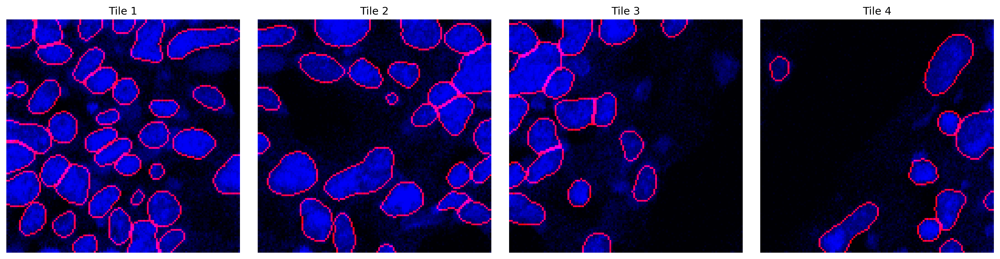

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(16,4))
titles = ['Tile 1', 'Tile 2', 'Tile 3', 'Tile 4']

for ax, m, img, title in zip(axes, mask[:4], tiles[:4], titles):
    overlay = plot_outlines(m, img)
    ax.imshow(overlay)
    ax.axis('off')
    ax.set_title(title)

plt.tight_layout()
plt.show()

### Stitching

In [ ]:
global_mask = stitch(mask, x, y, 0.2)

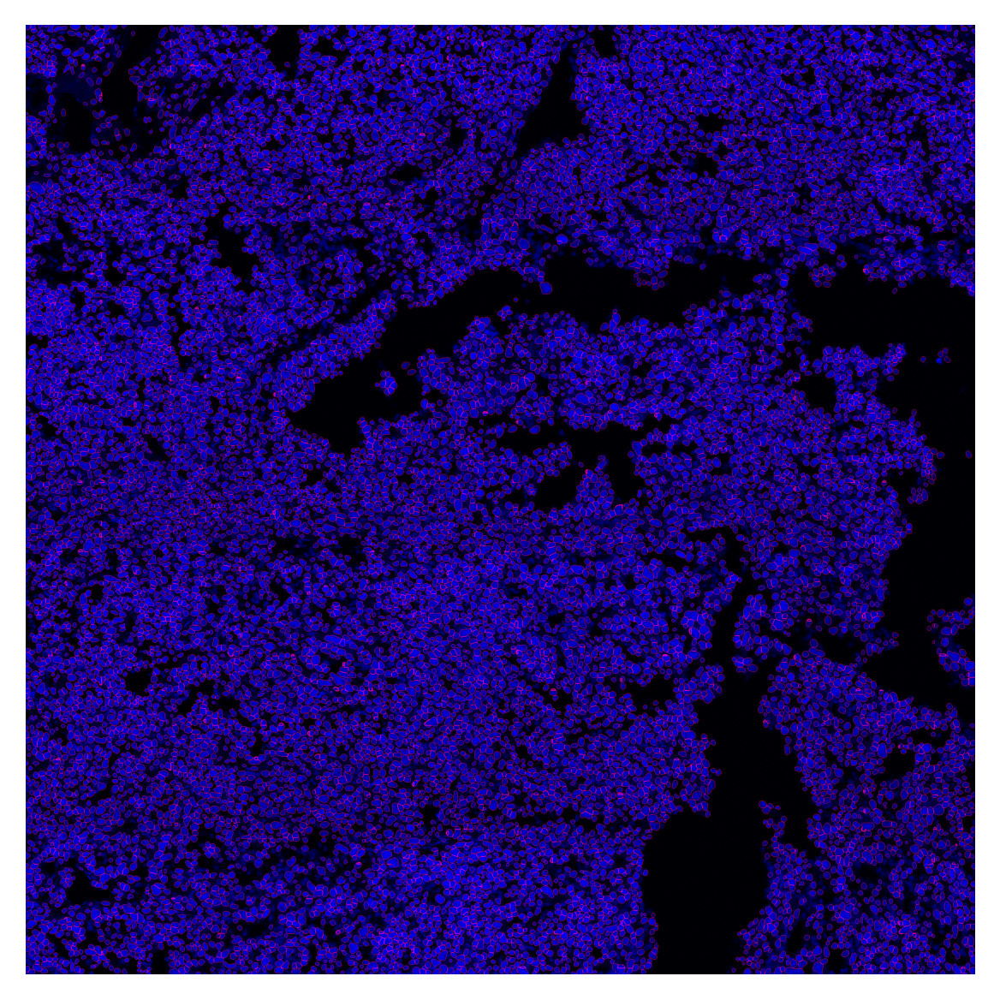

In [ ]:
nuclei_overlay = plot_outlines(global_mask, image_enh, save_path="/Users/mzarodniuk/Documents/SAI/NEST/data/nuclei_overlay.tif")
plt.imshow(nuclei_overlay)
plt.axis('off')
plt.show()

### Nuclear expansion

In [ ]:
cell_labels = expand_with_cap(global_mask,
                             spacing = get_physical_size("/Users/mzarodniuk/Documents/SAI/NDSAI_analysis/data/raw/01-29-25_PDPN_ERTR7_10um-selected/01-29-25_PDPN_ERTR7_49-2-1_NEG_Merged_ch00.tif", verbose=True),
                             fixed_expand=10.0)

Pixel size = 0.534 × 0.534 µm/px
Physical size = 6414.5 × 6488.7 µm


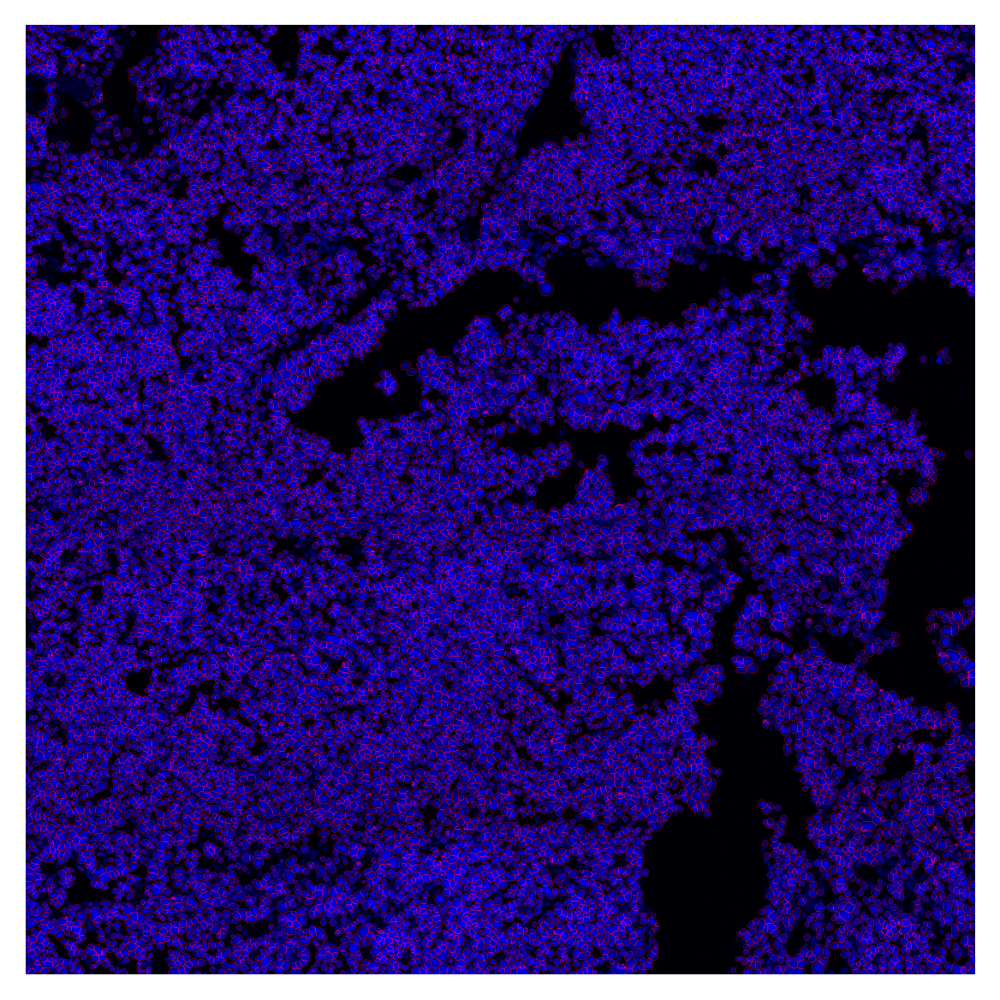

In [ ]:
cell_overlay = plot_outlines(cell_labels, image_enh, save_path="/Users/mzarodniuk/Documents/SAI/NEST/data/cell_overlay.tif")
plt.imshow(cell_overlay)
plt.axis('off')
plt.show()